# ❓ <font color='green'> <u> PROBLEM STATEMENT (Airlines_Data) </u>

## <font color = 'navy'>  Perform clustering (hierarchical,K means clustering and DBSCAN) for the airlines data to obtain optimum number of clusters. Draw the inferences from the clusters obtained.

### The file EastWestAirlinescontains information on passengers who belong to an airline’s frequent flier program. For each passenger the data include information on their <u>mileage history</u> and on different ways they accrued or spent miles in the <u>last year</u>. The goal is to try to <u>identify clusters</u> of passengers that have similar characteristics for the purpose of targeting different segments for different types of mileage offers.

#### <font color = 'candy'><u> Data Description: </u>
  - #### ID --Unique ID

- #### Balance--Number of miles eligible for award travel

- #### Qual_mile--Number of miles counted as qualifying for Topflight status

- #### cc1_miles -- Number of miles earned with freq. flyer credit card in the past 12 months:
- #### cc2_miles -- Number of miles earned with Rewards credit card in the past 12 months:
- #### cc3_miles -- Number of miles earned with Small Business credit card in the past 12 months:
    
    - #### 1 = under 5,000
    - #### 2 = 5,000 - 10,000
    - #### 3 = 10,001 - 25,000
    - #### 4 = 25,001 - 50,000
    - #### 5 = over 50,000

- #### Bonus_miles--Number of miles earned from non-flight bonus transactions in the past 12 months

- #### Bonus_trans--Number of non-flight bonus transactions in the past 12 months

- #### Flight_miles_12mo--Number of flight miles in the past 12 months

- #### Flight_trans_12--Number of flight transactions in the past 12 months

- #### Days_since_enrolled--Number of days since enrolled in flier program

- #### Award--whether that person had award flight (free flight) or not


## <font color ='olive'> 0.1 Go To<a class="anchor" id="0.1"></a>

1. [HIERARCHIAL CLUSTERING ALGORITHM](#1)

2. [K-MEANS CLUSTERING ALGORITHM ](#2)

3. [DBSCAN ALGORITHM](#3)

___

 * ### <font color = 'blue'> <u> IMPORT NECESSARY LIBRARIES </u>

In [183]:
import pandas as pd 
import numpy as np 
import seaborn as sns 
import plotly.express as pe 
import matplotlib.pyplot as plt 
%matplotlib inline
import warnings 
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (10,8)
plt.rcParams['figure.dpi'] = 250
sns.set_theme(style='darkgrid')
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer

* ### <font color = 'blue'> <u> READ DATA </u>

##### While importing data from excel file we need to mention the sheet name of the particular sheet from which we are importing the data. If no sheet name is provided, by default the function reads the first sheet in the file.

In [2]:
# Importing Data:
df = pd.read_excel('EastWestAirlines.xlsx', sheet_name= "data")

# Renaming Columns:
df.rename(columns = {'ID#':'ID', 'Award?':'Award'}, inplace= True)

#Set ID as Index Column
df.set_index('ID',inplace=True)

df.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
ID,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0
2,19244,0,1,1,1,215,2,0,0,6968,0
3,41354,0,1,1,1,4123,4,0,0,7034,0
4,14776,0,1,1,1,500,1,0,0,6952,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1


___

* ### <font color = 'blue'> <u> PERFORM EDA </u>

* ##### <font color ='green'> <u>Data Summary</u>

In [3]:
df.shape

(3999, 11)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3999 entries, 1 to 4021
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   Balance            3999 non-null   int64
 1   Qual_miles         3999 non-null   int64
 2   cc1_miles          3999 non-null   int64
 3   cc2_miles          3999 non-null   int64
 4   cc3_miles          3999 non-null   int64
 5   Bonus_miles        3999 non-null   int64
 6   Bonus_trans        3999 non-null   int64
 7   Flight_miles_12mo  3999 non-null   int64
 8   Flight_trans_12    3999 non-null   int64
 9   Days_since_enroll  3999 non-null   int64
 10  Award              3999 non-null   int64
dtypes: int64(11)
memory usage: 374.9 KB


> * #### There are 3999 records and 11 Variables.
> * #### "Award" is Nominal Data Variable represent "1" for award flight (free flight) provided and "0" for not provided. 
> * #### Variables like cc1_miles, cc2_miles, cc3_miles are in encoded form.

* ##### <font color ='green'> <u>Descriptive statistics</u>

In [5]:
df.describe()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
count,3.999000e+03,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.00000,3999.000000,3999.000000,3999.00000,3999.000000
mean,7.360133e+04,144.114529,2.059515,1.014504,1.012253,17144.846212,11.60190,460.055764,1.373593,4118.55939,0.370343
std,1.007757e+05,773.663804,1.376919,0.147650,0.195241,24150.967826,9.60381,1400.209171,3.793172,2065.13454,0.482957
min,0.000000e+00,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,2.00000,0.000000
25%,1.852750e+04,0.000000,1.000000,1.000000,1.000000,1250.000000,3.00000,0.000000,0.000000,2330.00000,0.000000
50%,4.309700e+04,0.000000,1.000000,1.000000,1.000000,7171.000000,12.00000,0.000000,0.000000,4096.00000,0.000000
75%,9.240400e+04,0.000000,3.000000,1.000000,1.000000,23800.500000,17.00000,311.000000,1.000000,5790.50000,1.000000
max,1.704838e+06,11148.000000,5.000000,3.000000,5.000000,263685.000000,86.00000,30817.000000,53.000000,8296.00000,1.000000


In [6]:
# Checking For null Value if any:
df.isna().sum()

Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award                0
dtype: int64

* ##### <font color ='green'><u> Checking for Duplicate Records and Removing if any </u>

In [7]:
df.duplicated().sum()

1

In [8]:
# Get all duplicated records:
df[df.duplicated(keep = False)]

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
ID,,,,,,,,,,,
3393,1000,0,1,1,1,0,0,0,0,1597,0
3899,1000,0,1,1,1,0,0,0,0,1597,0


> * #### All data is in valid range.
> * #### No null value is present.
> * #### One Duplicate Record is observed but ID is different for these records. So, they are different records.

___

* ### <font color = 'blue'> <u> DATA VISUALISATION </u>

* ##### <font color ='green'><u> For "Balance" and "Award" Variables</u>

<Axes: xlabel='Award', ylabel='Balance'>

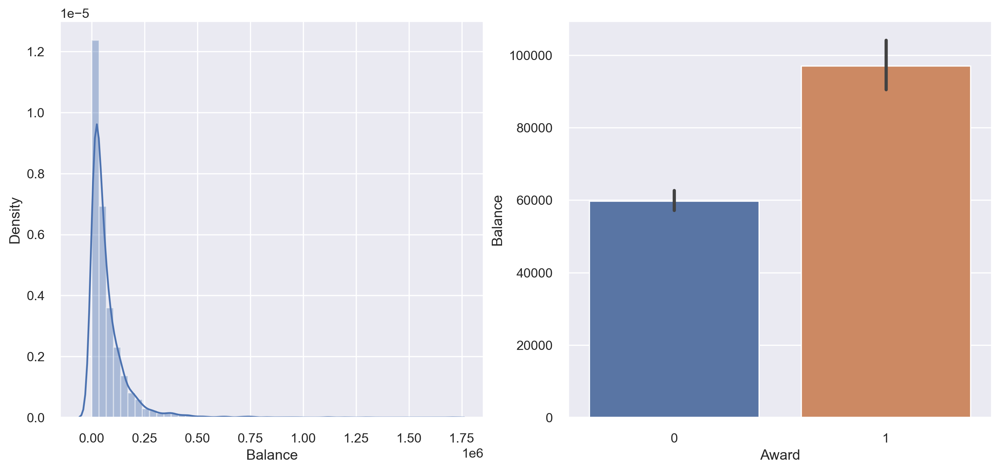

In [184]:
# Balance : Number of miles eligible for award travel
# whether that person had award flight (free flight) or not

plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.distplot(df['Balance'])

plt.subplot(1,2,2)
sns.barplot(x = df['Award'], y = df['Balance'])

> * #### The distribution plot of "Balance" is positively skewed. The outliers present at upper extreme of data.
> * #### The Barplot of "Award" Vs "Balance", shows that high number of miles belong to persons who awarded for free flight.

* ##### <font color ='green'><u>Heatmap </u>

In [10]:
Vis_data = df.drop({'cc1_miles','cc2_miles','cc3_miles','Award'}, axis = 1)
# We remove these columns as these variables are in their 

<Axes: >

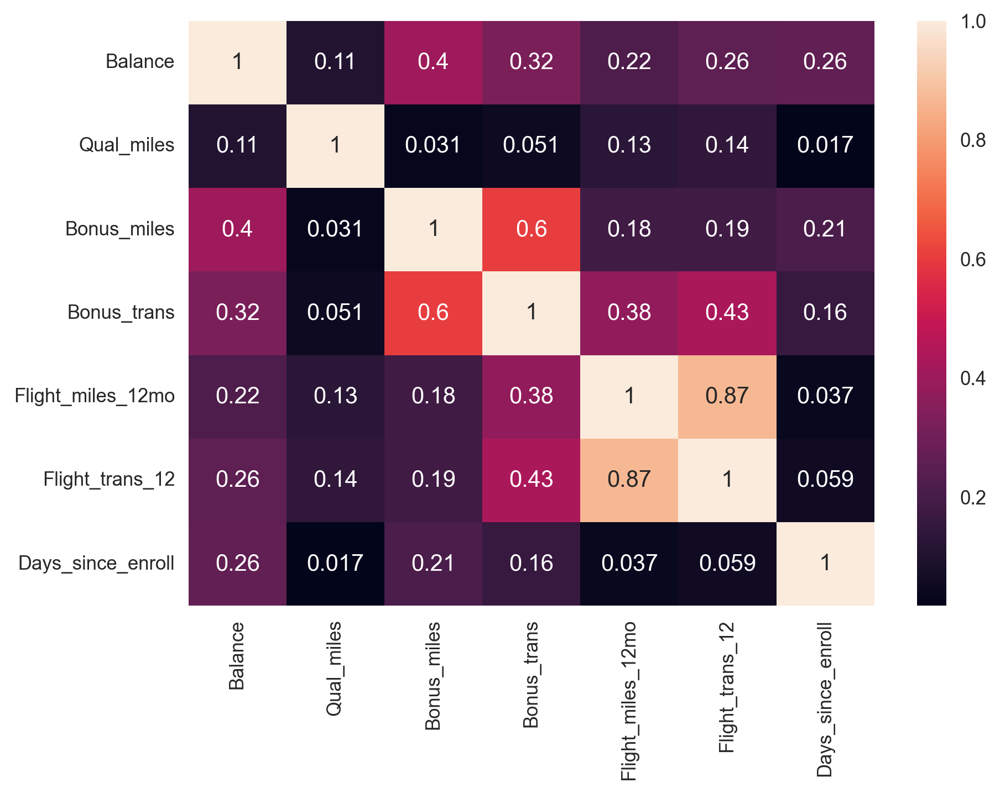

In [11]:
sns.heatmap(Vis_data.corr(), annot= True)

> * #### All Variables are Positively Correlated.
> * #### "Balance"(Number of miles eligible for award travel) have 40% correlation with "Bonus_miles"(Number of miles earned from non-flight bonus transactions in the past 12 months) with other variables it is lower than 40%. 
> * #### Variables "Flight_miles_12mo"(Number of flight miles in the past 12 months) and "Flight_trans_12"(Number of flight transactions in the past 12 months) are highly correlated. Which is much clear high transactions imples large number of miles.

* ##### <font color ='green'><u> Scatter Plot </u>

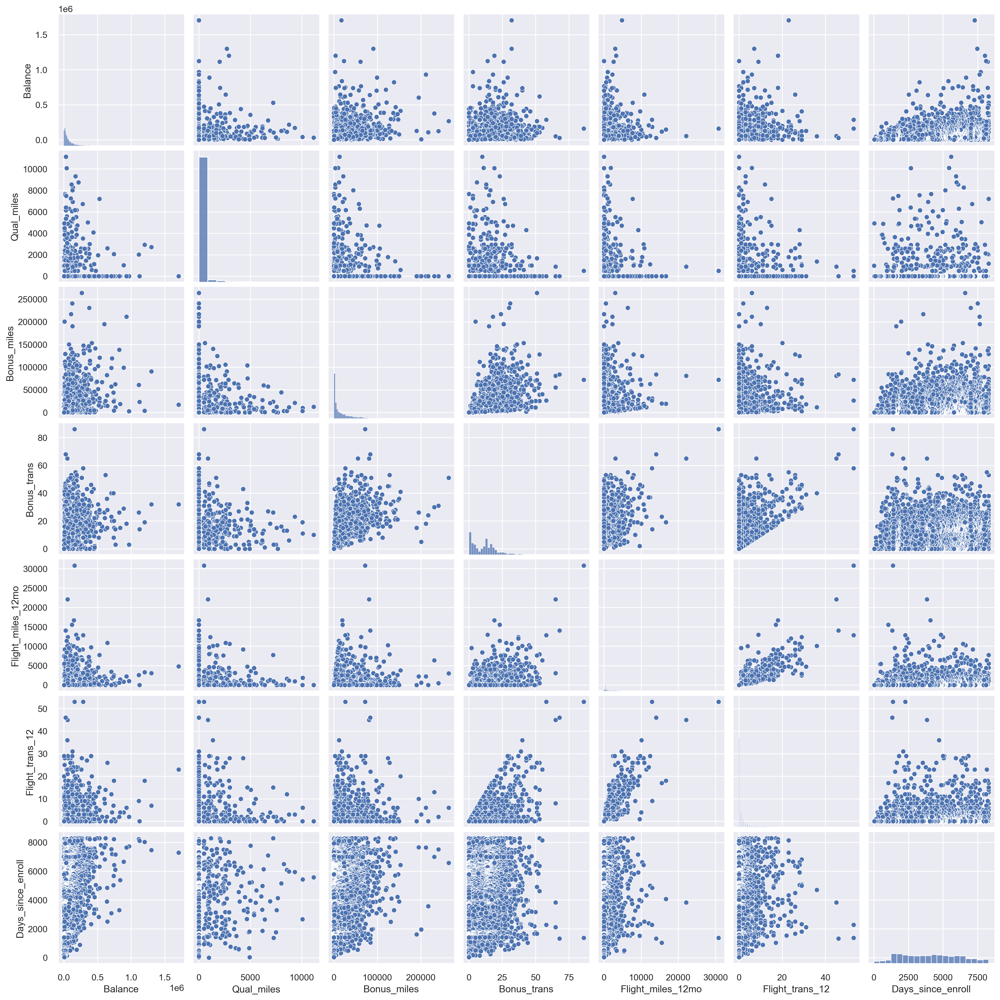

In [185]:
sns.pairplot(Vis_data)

> * #### In the scatterplots above we can see some patterns. Later we will see the how the clusters are distributed along the data. 

* ##### <font color ='green'><u> Box Plot </u>

<Axes: >

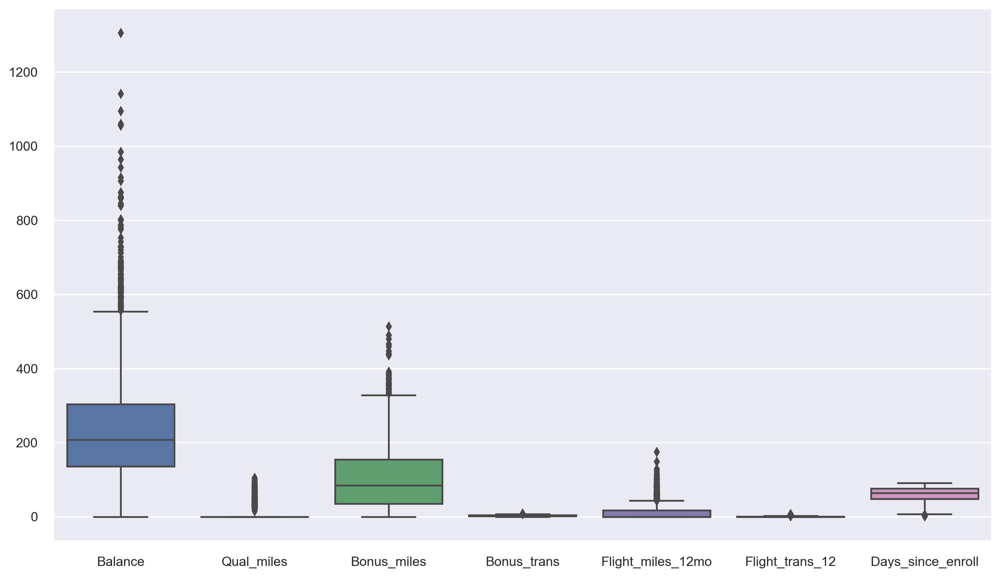

In [186]:
plt.figure(figsize=(14,8))
sns.boxplot(np.sqrt(Vis_data))

> * #### Data distribution have different scale range. So we will perform standardisation on our data for model building.
> * #### Outlier data points affects Hierarchial Clustering and K-means Clustering. But DBSCAN deals with noise data points. Let's see how these algorithms works with noisy data.

* ##### <font color ='green'><u> Column Charts : </u>

<Axes: xlabel='Award', ylabel='count'>

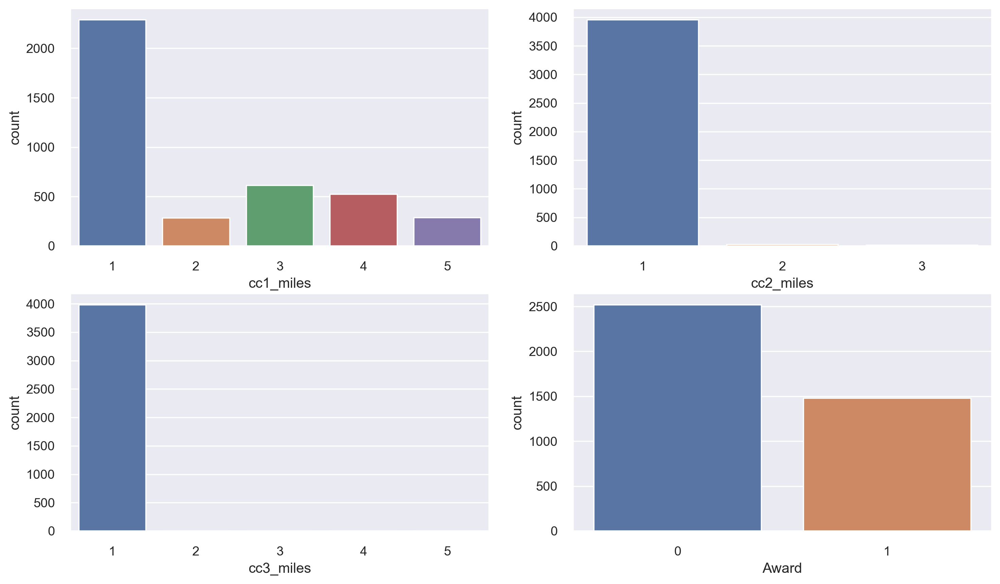

In [187]:
# Number of miles earned:
# 1 = under 5,000
# 2 = 5,000 - 10,000
# 3 = 10,001 - 25,000
# 4 = 25,001 - 50,000
# 5 = over 50,000

plt.figure(figsize=(14,8))
plt.subplot(2,2,1)
sns.countplot(x = df['cc1_miles'])

plt.subplot(2,2,2)
sns.countplot(x = df['cc2_miles'])

plt.subplot(2,2,3)
sns.countplot(x = df['cc3_miles'])

plt.subplot(2,2,4)
sns.countplot(x = df['Award'])

In [15]:
df['Award'].value_counts()

0    2518
1    1481
Name: Award, dtype: int64

> * #### cc1_miles (Number of miles earned with freq. flyer credit card), cc2_miles (Number of miles earned with Rewards credit card), cc3_miles (Number of miles earned with Small Business credit card) in the past 12 months all categories majorly belong to less than 5000 miles.
> * #### out of 3999 records only 1481 (37%) got the free flight award.

___

* ### <font color = 'blue'> <u> FEATURE SCALING  </u>

 ### <font color ='green'> ➡ <u>Standardisation:</u>

In [16]:
sc = StandardScaler()
x_sc = sc.fit_transform(df)
x_sc

array([[-4.51140783e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -3.62167870e-01,  1.39545434e+00, -7.66919299e-01],
       [-5.39456874e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -3.62167870e-01,  1.37995704e+00, -7.66919299e-01],
       [-3.20031232e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -3.62167870e-01,  1.41192021e+00, -7.66919299e-01],
       ...,
       [-4.29480975e-05, -1.86298687e-01,  6.83121167e-01, ...,
        -3.62167870e-01, -1.31560393e+00,  1.30391816e+00],
       [-1.85606976e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -9.85033311e-02, -1.31608822e+00, -7.66919299e-01],
       [-7.00507951e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -3.62167870e-01, -1.31754109e+00, -7.66919299e-01]])

In [17]:
x_sc.shape

(3999, 11)

 ### <font color ='green'> ➡ <u>Normalisation:</u>

In [18]:
minmax = MinMaxScaler()
x_norm = minmax.fit_transform(df)
x_norm

array([[0.01650773, 0.        , 0.        , ..., 0.        , 0.84374246,
        0.        ],
       [0.01128788, 0.        , 0.        , ..., 0.        , 0.83988425,
        0.        ],
       [0.02425685, 0.        , 0.        , ..., 0.        , 0.84784181,
        0.        ],
       ...,
       [0.0431695 , 0.        , 0.5       , ..., 0.        , 0.16879672,
        1.        ],
       [0.03220189, 0.        , 0.        , ..., 0.01886792, 0.16867615,
        0.        ],
       [0.00176908, 0.        , 0.        , ..., 0.        , 0.16831444,
        0.        ]])

In [19]:
x_norm.shape

(3999, 11)

___

* ### <font color = 'blue'> <u> MODEL BUILDING </u>

[GO TO TOP](#0.1) 

## <font color = 'magenta'> 1. <u>HIERARCHIAL CLUSTERING ALGORITHM </u><a class="anchor" id="1"></a>

* ##### <font color = "candy"> Hierarchial Clustering </font>is a type of unsupervised machine learning algorithm used to cluster unlabeled data points. It is a data mining technique that groups similar objects into clusters. The clusters are visually represented in a hierarchical tree called a dendrogram.

* ##### <font color = "candy"> Types of hierarchical clustering:
    
    + <b>Agglomerative</b>: This is bottom-up approach of clustering cause the cluster creation started with calculating the distance between the data points.
    + <b>Divisive</b>: This is top-down approach is followed where all the data points are treated as one big cluster and the clustering process involves dividing the one big cluster into several small clusters.
    
* #### Here we go with Agglomerative clustering with different methods of Linkages.
    
* #### Linkages Calculates the distance between data-points and clusters.
    
* #### To visualise them we plot these distances using dendrogram and see whether they can able to create and differentiate between clusters clearly.

 ### <font color ='green'> ➡ <u>Types of Linkages</u>

* #### Single Linkage
* #### Complete Linkage
* #### Average Linkage
* #### Centroid Linkage
* #### Ward Linkage
* #### Weighted Linkage
* #### Median Linkage 

* ### <font color ='olive'><u> Dendrogram </u>
    * #### To visualise how many number of clusters should be there we plot dendrogram. Cut at longest vertical line gives us number of clusters we should create.

 ### <font color ='green'> ➡ <u>For Standardised Data:</u>

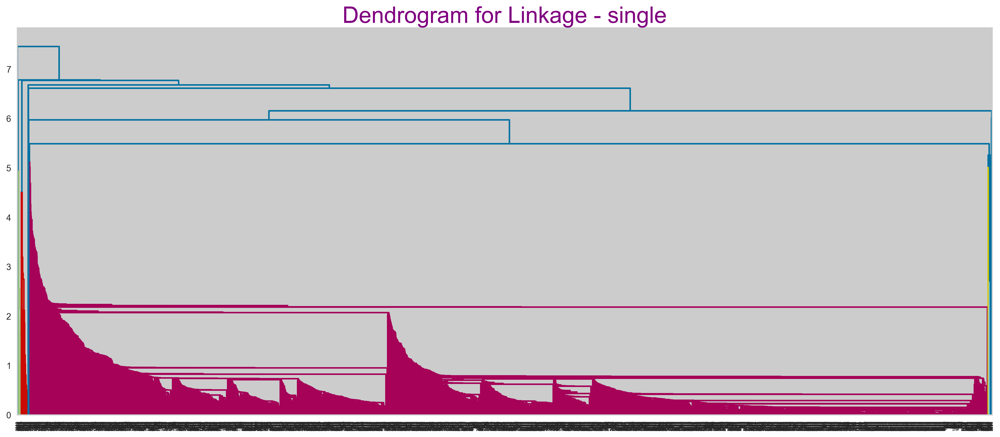

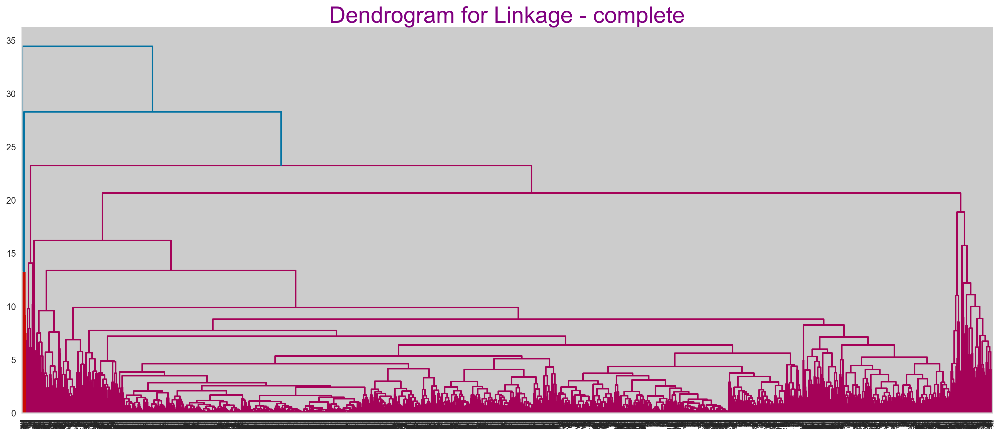

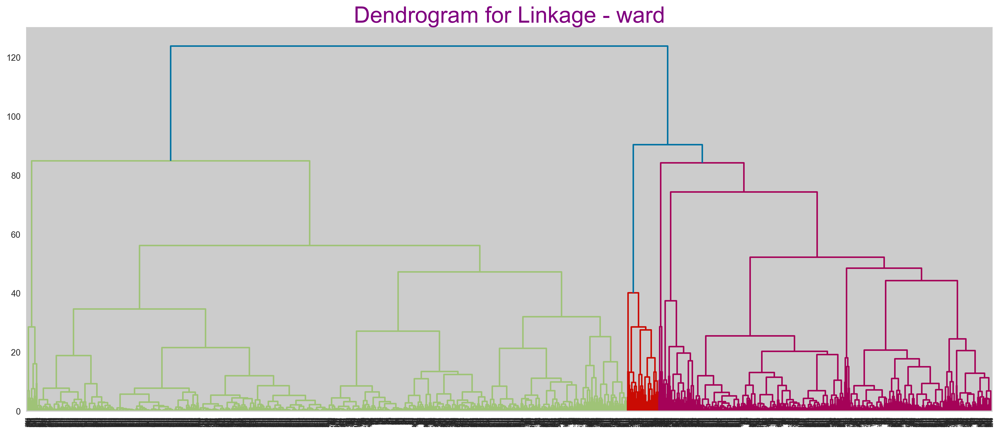

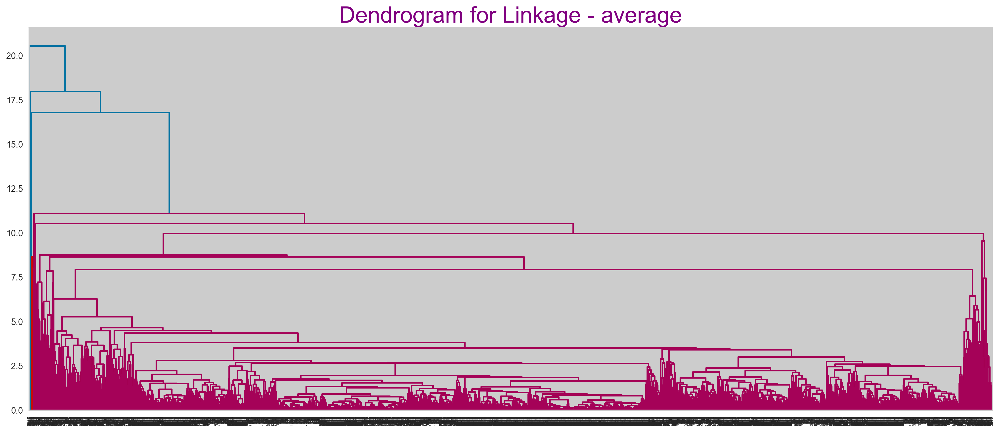

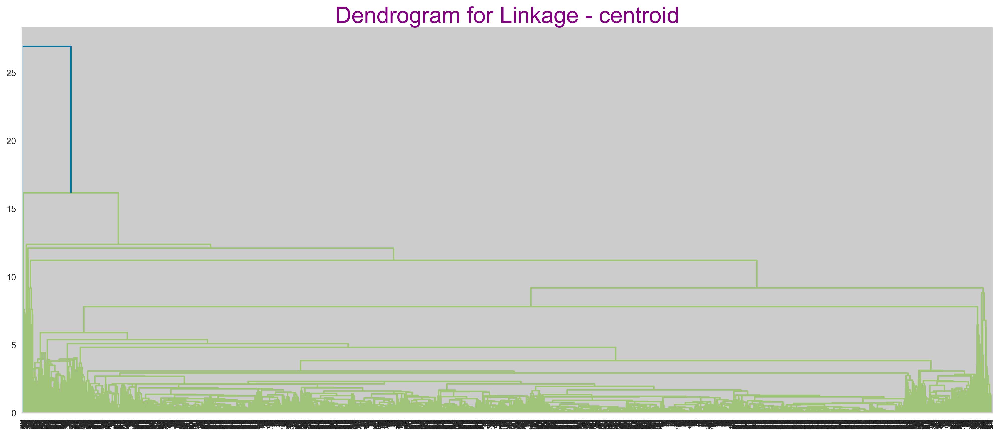

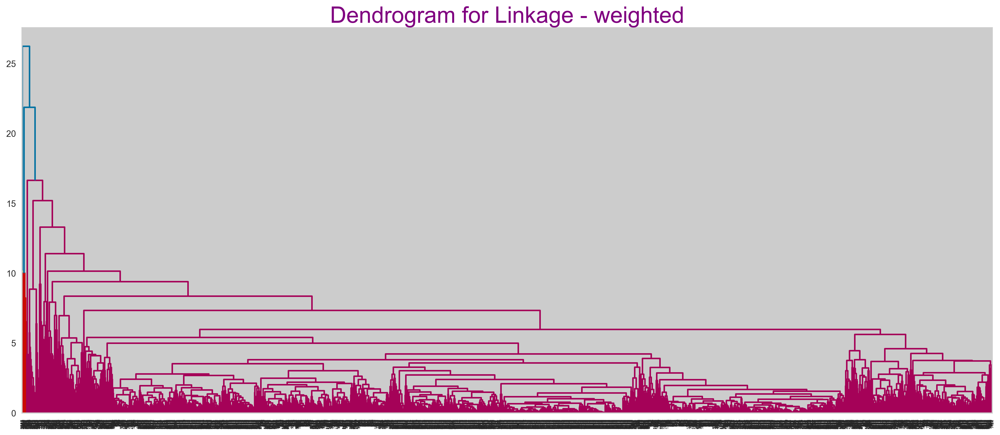

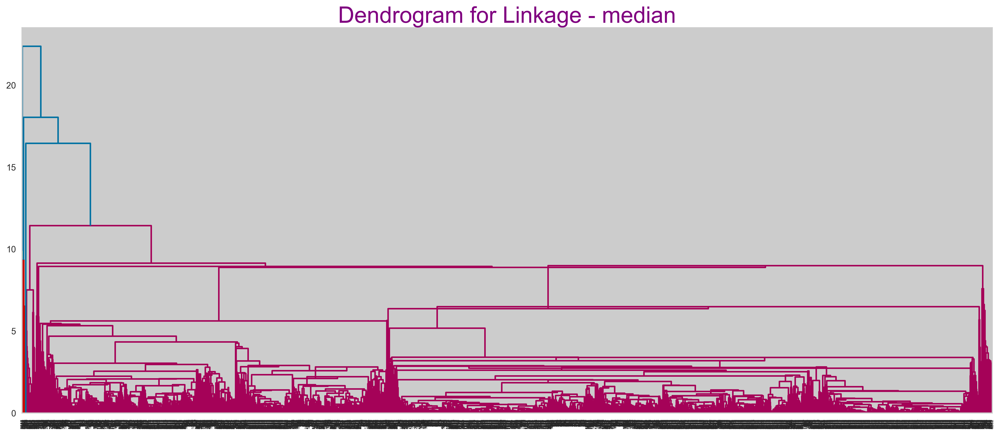

In [20]:
for methods in ['single','complete','ward','average','centroid','weighted','median']:
    plt.figure(figsize =(20, 8)) 
    
    dict = {'fontsize':26,'fontweight' :20, 'color' : 'purple'}
    plt.title('Dendrogram for Linkage - {}'.format(methods), fontdict = dict)
    denrograms_other = sch.dendrogram(sch.linkage(x_sc, method = methods,optimal_ordering= False))

 ### <font color ='green'> ➡ <u>For Normalised Data:</u>

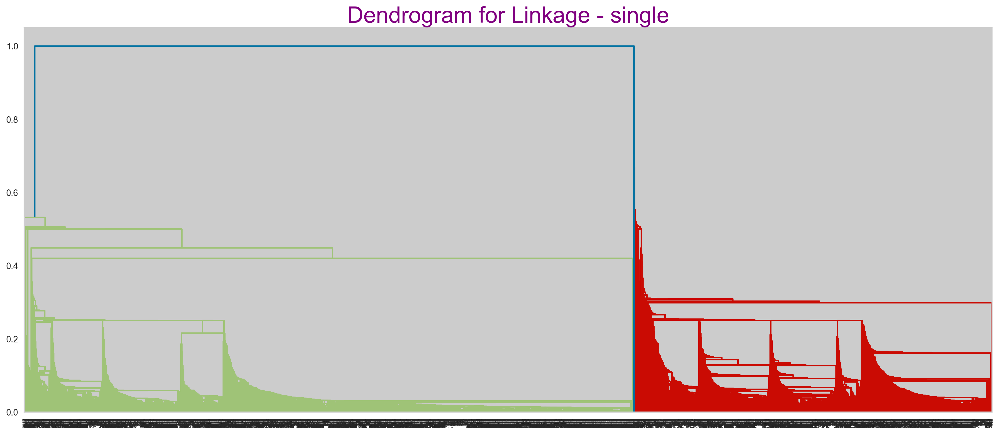

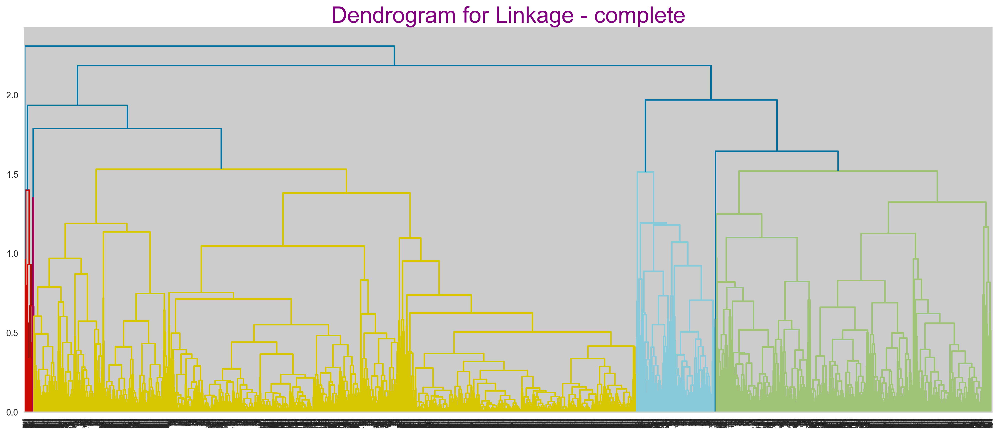

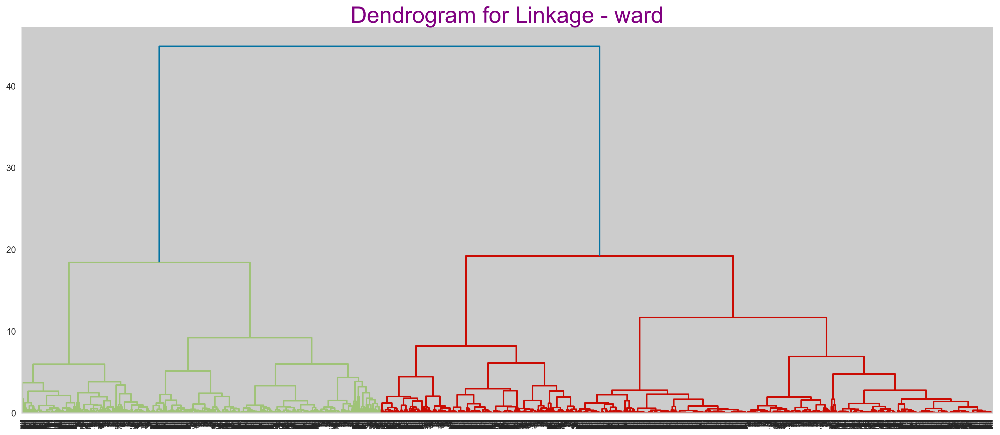

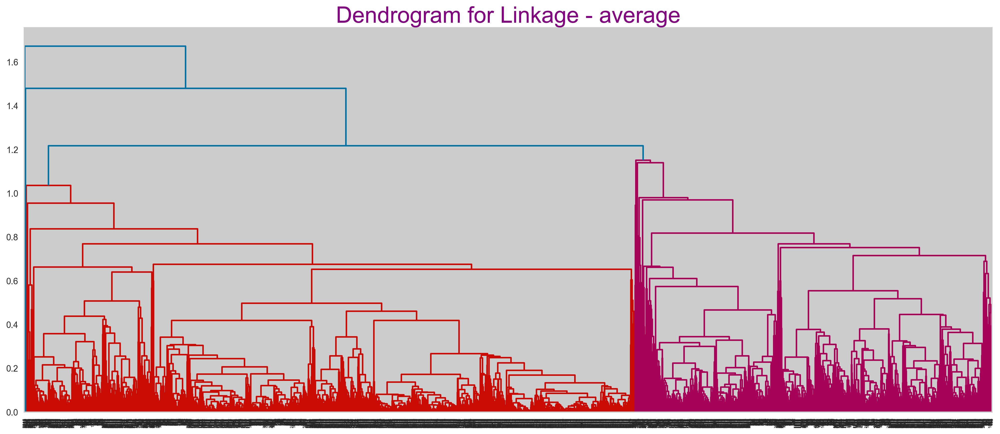

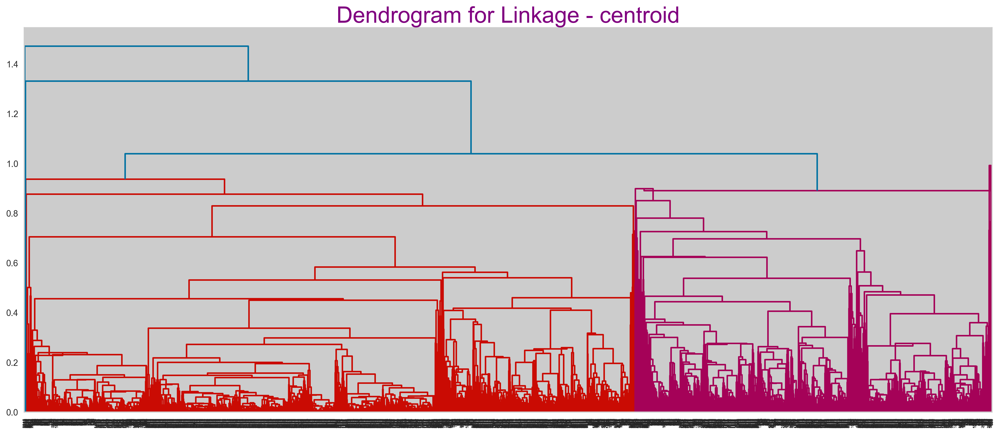

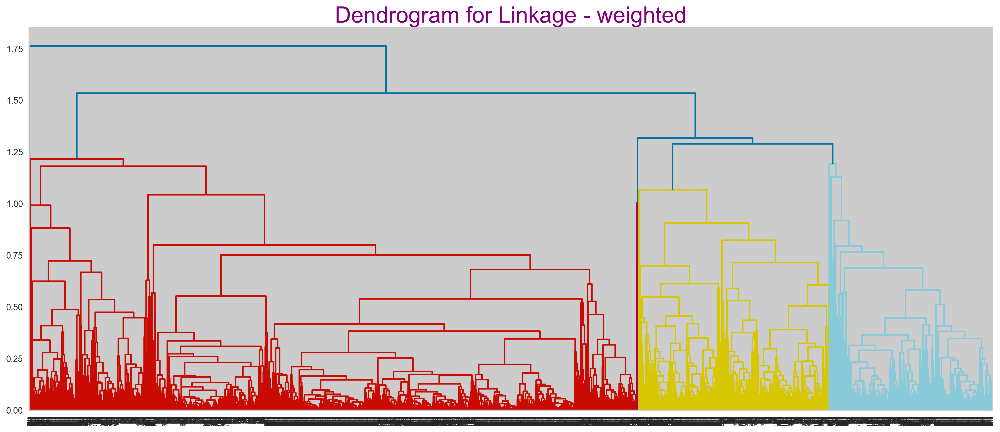

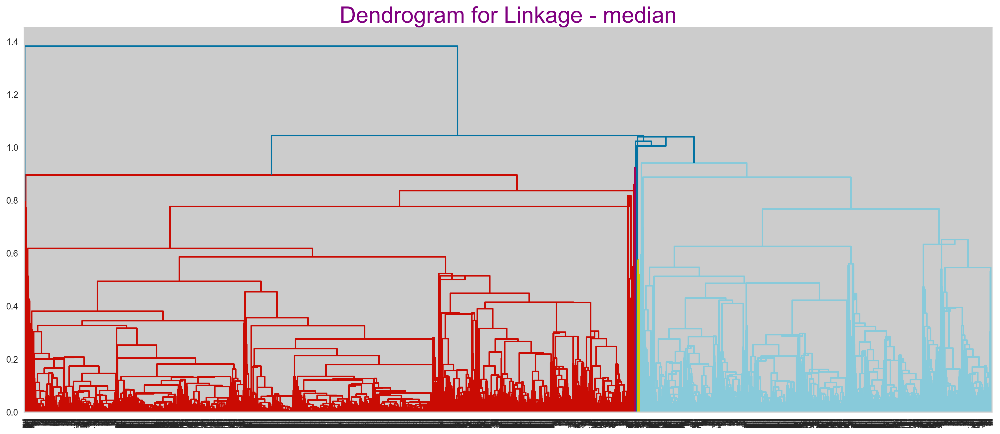

In [21]:
for methods in ['single','complete','ward','average','centroid','weighted','median']:
    plt.figure(figsize =(20, 8)) 
    dict = {'fontsize':26,'fontweight' :40, 'color' : 'purple'}
    plt.title('Dendrogram for Linkage - {}'.format(methods), fontdict = dict)
    
    denrograms_other = sch.dendrogram(sch.linkage(x_norm, method = methods,optimal_ordering= False))

> * #### With Standardised data in Ward linkage method we can see distingwish between 2 major clusters but for other methods we can't see proper clustering in dendrograms.
> * #### While with Normalised data the all the dendrograms show more clear picture for different clusters compared to Standardised data.
> * #### The dendrogram for Ward Linkage method with Normalised data clearly distingwish 2 major clusters than Satandardised data.
> * #### So, we for our model building purpose we go with <u>Normalised data and Ward linkage method</u> as type of linkage.

### <font color ='green'> ➡ <u> Ward Linkage Method with Normalised Data: </u>

* ##### <font color ='olive'> Ward Method :
    
    + ##### Ward's method is a variance method that attempts to minimize the within-cluster variance. It's a hierarchical clustering method that attempts to reduce variance within each cluster.

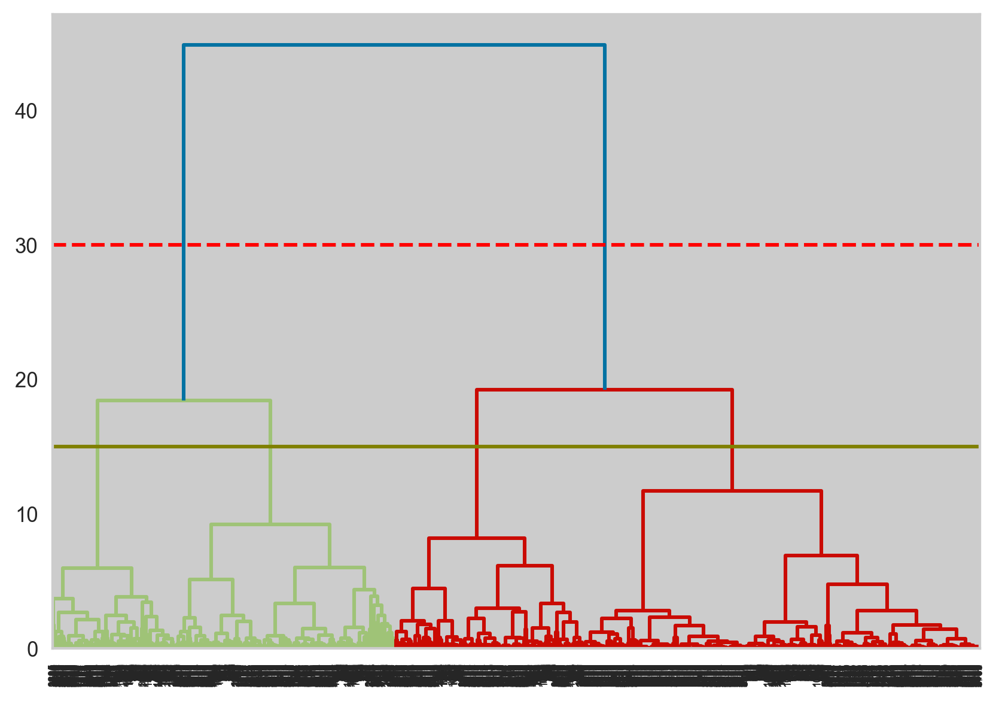

In [22]:
dendro_ward = sch.dendrogram(sch.linkage(x_norm, method= "ward"))
plt.axhline(y= 15, c= "olive", linestyle= "-") 
plt.axhline(y= 30, c= "red", linestyle= "--")

> * #### As we have target column ("Award") may be the 2 groups created accoring to that variable. 
> * #### Red dotted line cuts the longest blue line with making 2 clusters. But still we see why the further division with 4 clusters had done.

* ##### <font color ='candy'> <u> Two Clusters Division</u>

In [23]:
HC_1 = AgglomerativeClustering(n_clusters= 2) 

Clusters_1 = HC_1.fit_predict(x_norm)
Clusters_1

array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [24]:
df ['Clusters_1'] = Clusters_1
df.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Clusters_1
ID,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,0
2,19244,0,1,1,1,215,2,0,0,6968,0,0
3,41354,0,1,1,1,4123,4,0,0,7034,0,0
4,14776,0,1,1,1,500,1,0,0,6952,0,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1,1


<Axes: xlabel='Balance', ylabel='Bonus_miles'>

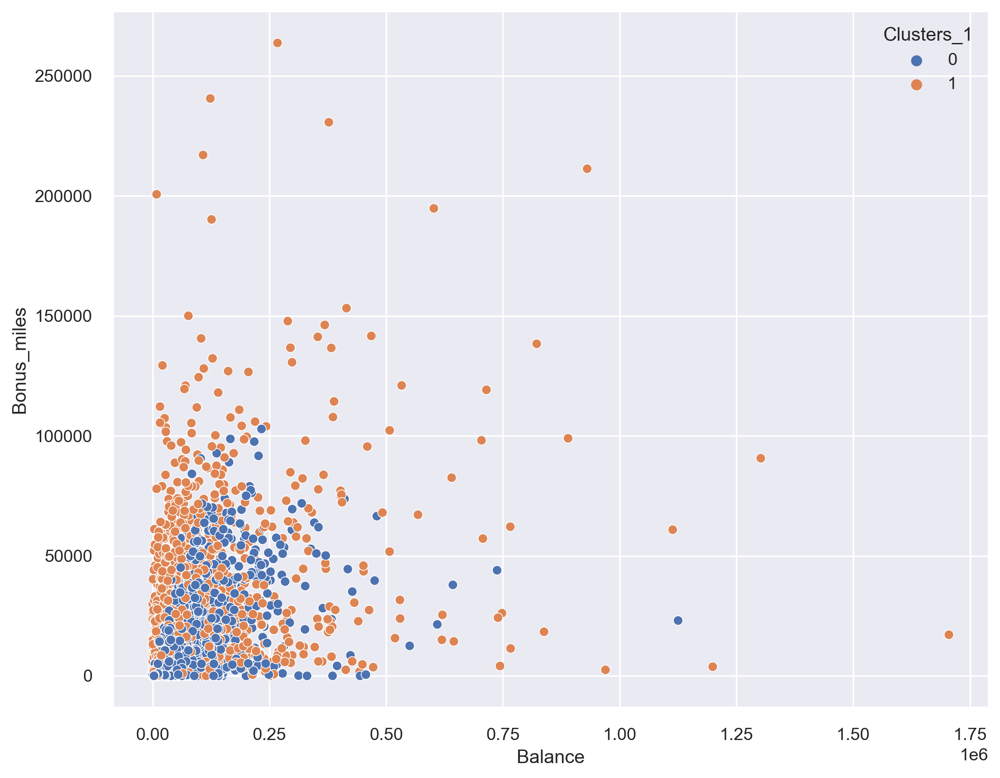

In [188]:
# Visualising the Clusters:
sns.scatterplot(data=df, x= 'Balance', y='Bonus_miles', hue= 'Clusters_1') 
# As variables 'Balance' and 'Bonus_miles' have good correlation compared to other variables.

> * #### We can't see proper clustering in this scatter plot with two clusters.
> * #### Let's see the 2 cluster division is according to target variable or not. 

<Axes: xlabel='Balance', ylabel='Award'>

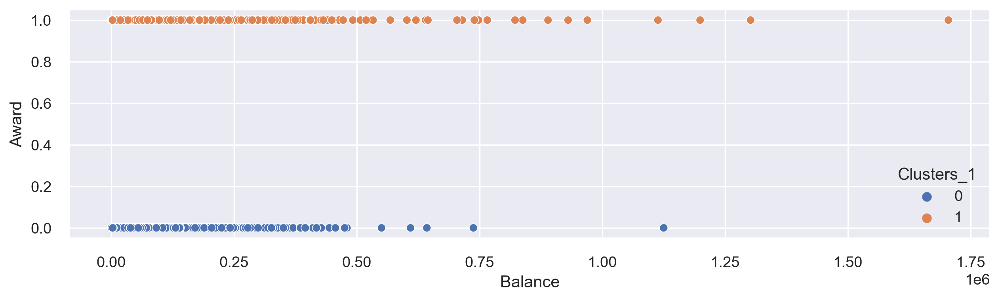

In [190]:
# Visualising the Clusters according to target column: 
plt.figure(figsize=(12,3))
sns.scatterplot(data=df, x='Balance', y='Award', hue= 'Clusters_1')

> * #### Hence this 2 cluster division is according to target variable "Award". 

In [27]:
df.groupby("Clusters_1").agg('mean')

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
Clusters_1,,,,,,,,,,,
0,59807.839555,87.602462,1.705322,1.01390,1.008737,10227.689039,9.142971,226.292295,0.652502,3820.652105,0.0
1,97053.051317,240.196489,2.661715,1.01553,1.018231,28905.414585,15.782579,857.501013,2.599595,4625.062120,1.0


In [28]:
df["Clusters_1"].value_counts()

0    2518
1    1481
Name: Clusters_1, dtype: int64

> * #### This 2 cluster division is according to target variable "Award".
> * #### Further more Cluster-1 have high Number of miles eligible for award travel.
> * #### Mean 'Bonus_miles' (Number of miles earned from non-flight bonus transactions in the past 12 months) is also high for Cluster-1.
> * #### For more clearity let's check 4 Cluster Division.

* ##### <font color ='candy'> <u> Four Clusters Division</u>

In [29]:
HC_2 = AgglomerativeClustering(n_clusters= 4) 

Clusters_2 = HC_2.fit_predict(x_norm)
Clusters_2

array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [30]:
df ['Clusters_2'] = Clusters_2
df.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Clusters_1,Clusters_2
ID,,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,0,0
2,19244,0,1,1,1,215,2,0,0,6968,0,0,0
3,41354,0,1,1,1,4123,4,0,0,7034,0,0,0
4,14776,0,1,1,1,500,1,0,0,6952,0,0,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1,1,3


<Axes: xlabel='Balance', ylabel='Bonus_miles'>

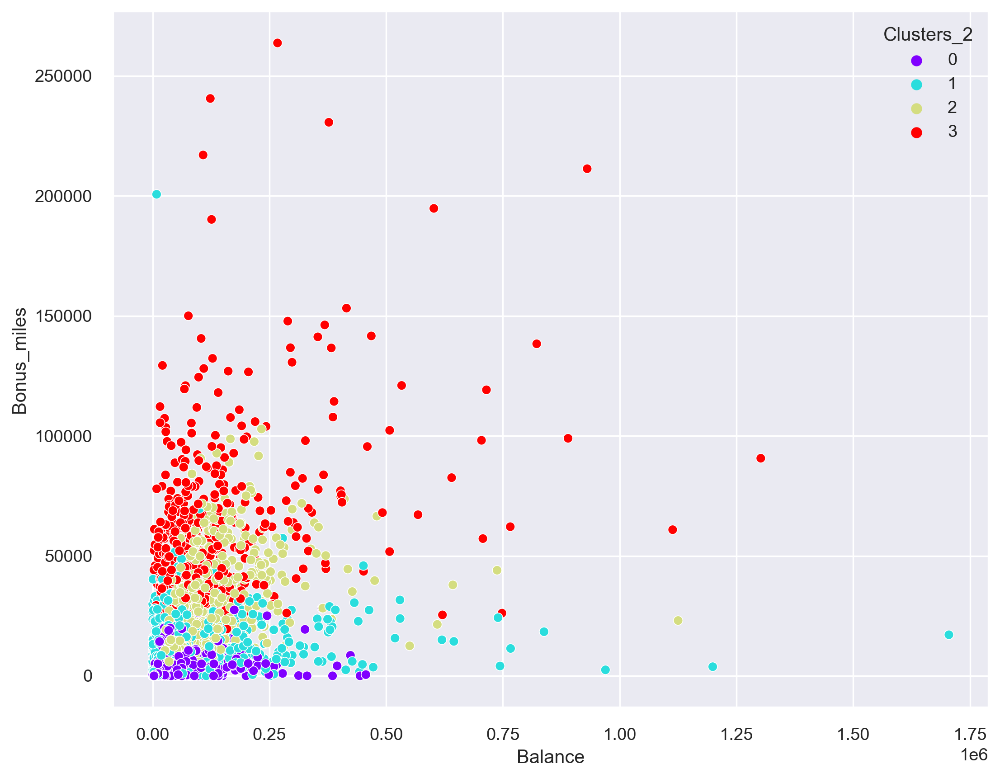

In [191]:
# Visualising the Clusters: 
sns.scatterplot(data=df, x= 'Balance', y='Bonus_miles', hue= 'Clusters_2', palette= 'rainbow')  

In [32]:
pe.scatter_3d(data_frame=df, x = 'Balance', y = 'Bonus_miles' ,z = 'Flight_miles_12mo', color='Clusters_2')

In [33]:
df.groupby("Clusters_2").agg('mean')

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Clusters_1
Clusters_2,,,,,,,,,,,,
0,37876.890058,52.797076,1.000000,1.019883,1.000585,2558.508187,5.730994,239.314035,0.697076,3562.376608,0.0,0.0
1,79848.233615,285.097252,1.699789,1.024313,1.000000,12079.774841,12.133192,781.939746,2.369979,4372.173362,1.0,1.0
2,106221.111386,161.262376,3.198020,1.001238,1.025990,26458.257426,16.363861,198.733911,0.558168,4367.250000,0.0,0.0
3,127475.028037,160.801869,4.362617,1.000000,1.050467,58656.919626,22.235514,991.110280,3.005607,5072.226168,1.0,1.0


> * #### In this four clusters division Group-1 and Group-3 distingwished as 1 for 'Award'(free flight)
> * #### Balance (Number of miles eligible for award travel), Qual_miles (Number of miles counted as qualifying for Topflight status) and Bonus_miles (Number of miles earned from non-flight bonus transactions in the past 12 months) for Group-2 is highest than Group-1 still it was not awarded for free flight, which shows that only high number of miles does not classify as awarded for free flight. 
> * #### We can see Flight_miles_12mo (Number of flight miles in the past 12 months) and Flight_trans_12 (Number of flight transactions in the past 12 months) are high for Group-1 and Group-3 which are awarded for free flight.
> * #### Number of flight miles (Flight_miles_12mo) in last year is much affecting variable for free flight (Award).

 ### <font color ='green'> ➡ <u> Evaluation for final Clusters selection :</u>
    
* ####  We use the labled data which we got from our model building in <u>logistic regression model</u> to analyse the performance of both clusters.

 * ##### <font color ='candy'> <u>For Two Clusters:</u>

In [34]:
y_1 = df ['Clusters_1']

In [35]:
xtrain_1,xtest_1,ytrain_1,ytest_1 = train_test_split(x_norm, y_1, test_size= 0.2, random_state= 42)

In [36]:
lg = LogisticRegression()

lg.fit(xtrain_1,ytrain_1)
ypred_1 = lg.predict(xtest_1)

In [37]:
print(classification_report(ytest_1,ypred_1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       492
           1       1.00      1.00      1.00       308

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800



> #### <font color = 'orange'> Accuracy  ➡ 100%

* ##### <font color ='candy'> <u> For Four Clusters:</u>

In [38]:
y_2 = df ['Clusters_2']

In [39]:
xtrain_2,xtest_2,ytrain_2,ytest_2 = train_test_split(x_norm, y_2, test_size= 0.2, random_state= 42)

In [40]:
lg.fit(xtrain_2,ytrain_2)
ypred_2 = lg.predict(xtest_2)

In [41]:
print(classification_report(ytest_2,ypred_2))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       322
           1       0.98      0.99      0.99       188
           2       1.00      0.98      0.99       170
           3       0.99      0.97      0.98       120

    accuracy                           0.99       800
   macro avg       0.99      0.99      0.99       800
weighted avg       0.99      0.99      0.99       800



>  #### <font color = 'orange'> Accuracy  ➡ 90%

 >  #### For Two Clusters division we get 100% accuracy as clustering is same as our target variable "Award".
 > #### Four Clusters division have 90% accuracy which is also good.
 > #### Let's see how many clusters we get form K-means clustering and DBSCAN.

<br>

 ___

[GO TO TOP](#0.1) 

## <font color = 'magenta'> 2. <u>K-MEANS CLUSTERING ALGORITHM </u><a class="anchor" id="2"></a>

* ##### <font color = "candy"> K-means clustering </font> is a method for grouping unlabeled data into clusters. It's a centroid-based algorithm that assigns data points to clusters based on their distance from a centroid. The goal is to minimize the sum of the squared distances between objects and their assigned cluster means.

* ##### <font color = "candy"> Steps in cluster creation:
    
    1) Initially we need to provide number of clusters(k) randomly, for which centroids are randomly generated.
    2) Then each and every data point computes distance (Euclidean) from centroids, which has minimum distance data point goes to that cluster.
    3) With new data point centroid location goes on changing. 
    4) Results in creation of final clusters.
    5) But in K-means clustering there was chances of creation of one single clustering. To overcome this issue some modifications are done in K-means++ 
    
* ##### <font color = "candy"> K-means++ 
    + It maintains sufficient distance between each clusters and creates optimal number of clusters.
    + It tries to reduce variance within the clusters and tries to maximise variance between the clusters.
    
* ##### <font color = "candy"> Elbow Graph For Selection of K:
    + For selection of optimal number of clusters we use elbow curve it is line chart ploted for number of clusters against WCSS value.
    + WCSS value is within the cluster sum of squares i.e. average distance of all data points to it's centroid within the cluster.
    + We choose that k value where there is drastic change in WCSS value.
    
* ##### <font color = "candy"> Silhoutte Score :
    + It is a metric that measures the quality of a clustering algorithm. It evaluates how well-defined and distinct clusters are created, by measuring how well a data point fits into its assigned cluster.

 ### <font color ='green'> ➡ <u>Selection of K :</u>

* ##### <font color ='candy'> <u>  With Standardised Data:</u>

In [42]:
# Computing wcss value for Standardised Data:
wcss = []

for i in range(1,15):
    km = KMeans(n_clusters=i)
    km.fit_predict(x_sc)
    wcss.append(km.inertia_)   # inertia_ function computes wcss value 

Text(0, 0.5, 'WCSS')

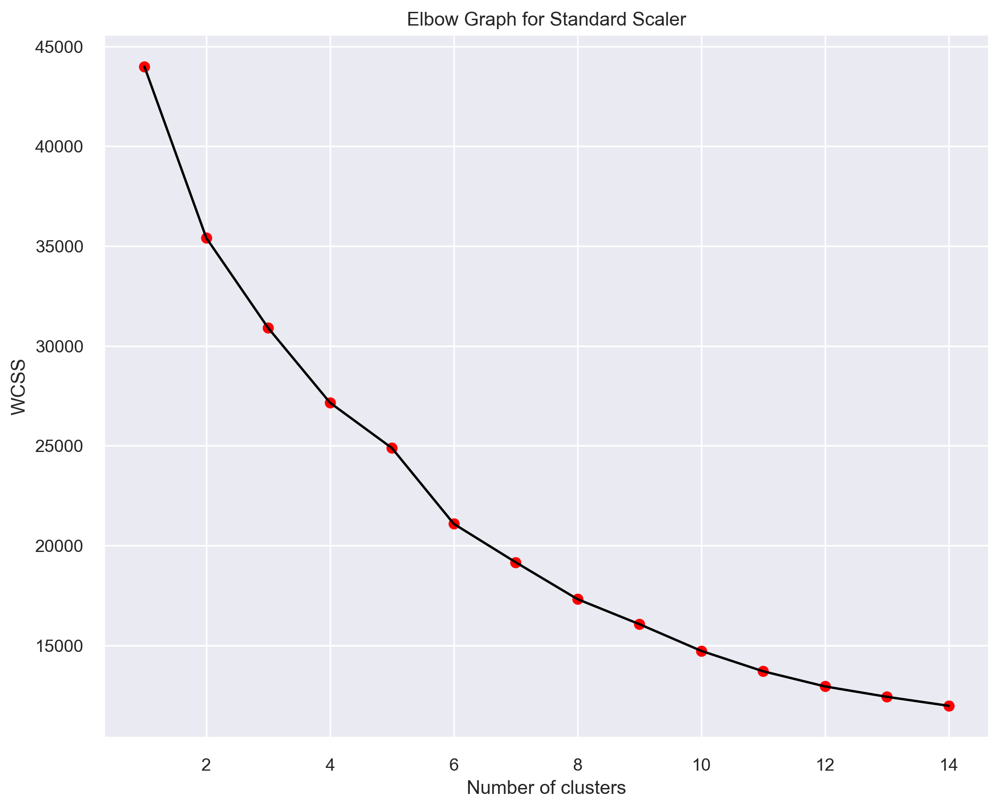

In [192]:
# Elbow Graph for Standardised Data:
plt.plot(range(1,15),wcss,color = 'black')
plt.scatter(range(1,15),wcss,color='red')
plt.title('Elbow Graph for Standard Scaler')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

In [44]:
# Silhoutte Score:
sil_score_sc = []

for i in range(2,10):
    km = KMeans(n_clusters=i)
    y_sc = km.fit_predict(x_sc)
    sil_score_sc.append(silhouette_score(x_sc,y_sc))

In [45]:
sil_score_sc

[0.32542136327826215,
 0.31191384766627117,
 0.30954596647693405,
 0.32310166592027567,
 0.33321033024415825,
 0.30368613029050384,
 0.23655403102028674,
 0.2976852682684941]

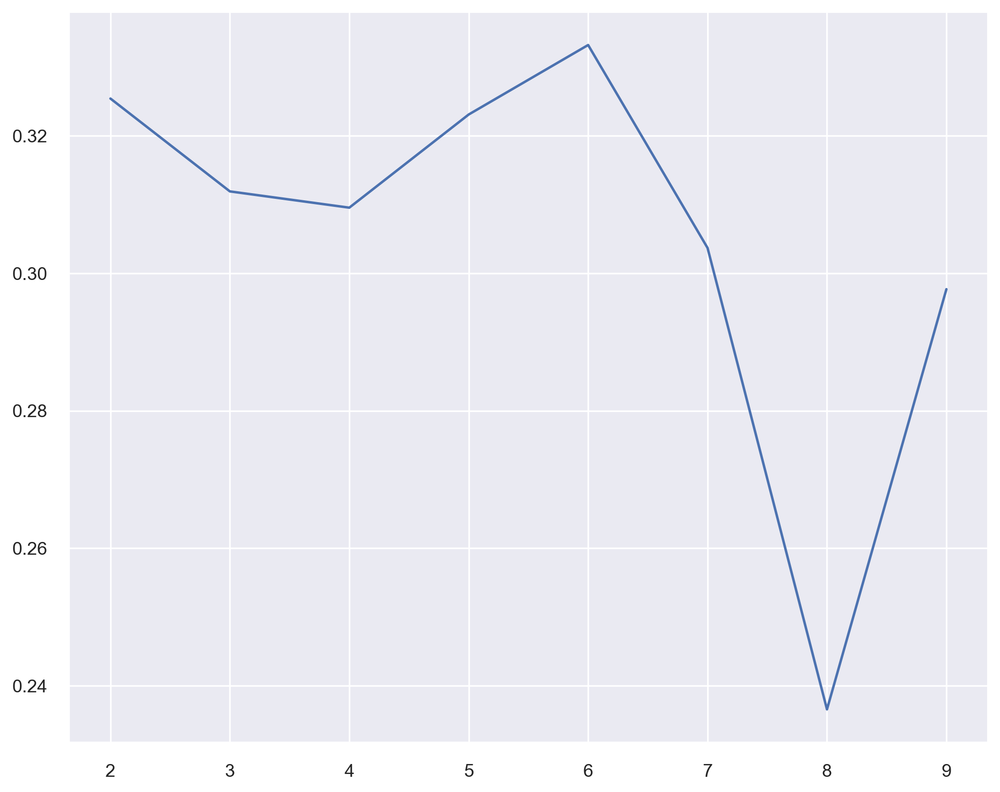

In [193]:
# Ploting Silhoutte Score:
plt.plot(range(2,10),sil_score_sc)

> * #### There is not much difference in Silhoutte Scores from clusters 2 to 7. 
> * #### Silhoutte Score with Standardised data is highest for K = 6 (0.33)

 #### <font color ='Candy'> ➡ <u>With Normalised Data:</u>

In [48]:
# Computing wcss value for Normalised Data:
wcss_norm = []

for i in range(1,15):
    km = KMeans(n_clusters=i)
    km.fit_predict(x_norm)
    wcss_norm.append(km.inertia_)

Text(0, 0.5, 'WCSS')

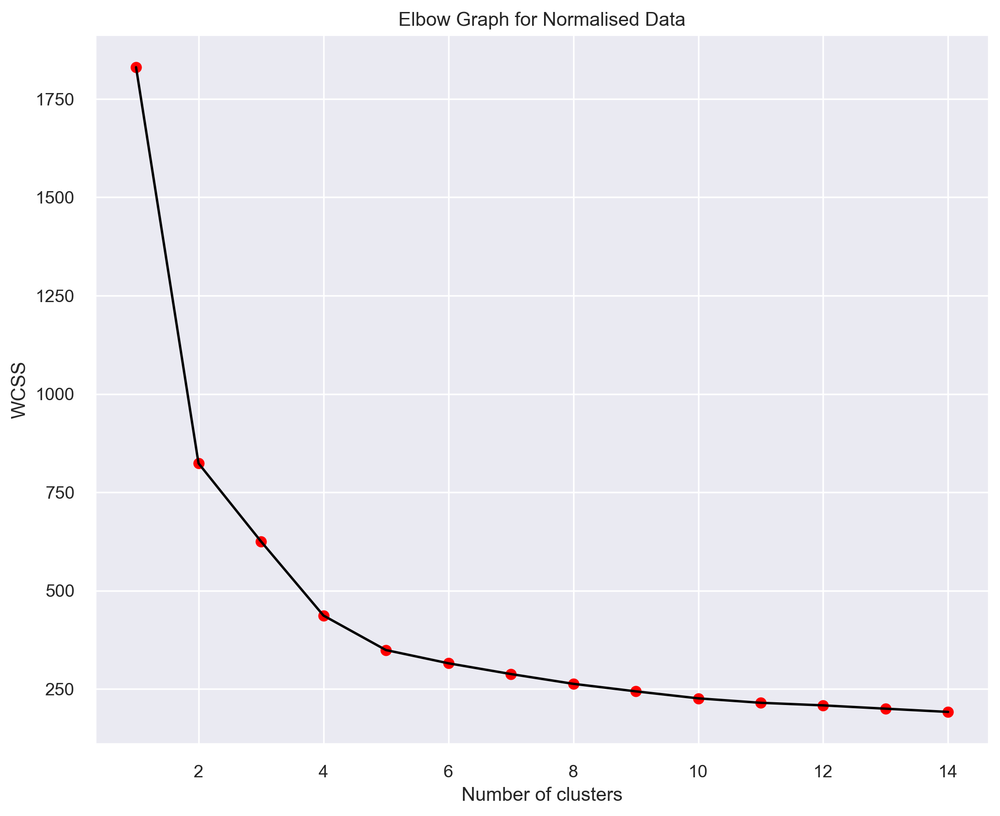

In [194]:
# # Elbow Graph for Normalised Data:
plt.plot(range(1,15),wcss_norm,color = 'black')
plt.scatter(range(1,15),wcss_norm,color='red')
plt.title('Elbow Graph for Normalised Data')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

In [50]:
# Silhoutte Score:
sil_score_norm = []

for i in range(2,10):
    km = KMeans(n_clusters=i)
    y_norm = km.fit_predict(x_norm)
    sil_score_norm.append(silhouette_score(x_norm,y_norm))

In [51]:
sil_score_norm

[0.535930510919477,
 0.46484529388583046,
 0.47483765255961,
 0.4430672072796034,
 0.40269644798954074,
 0.39104083236989395,
 0.38032207164095894,
 0.349924233506313]

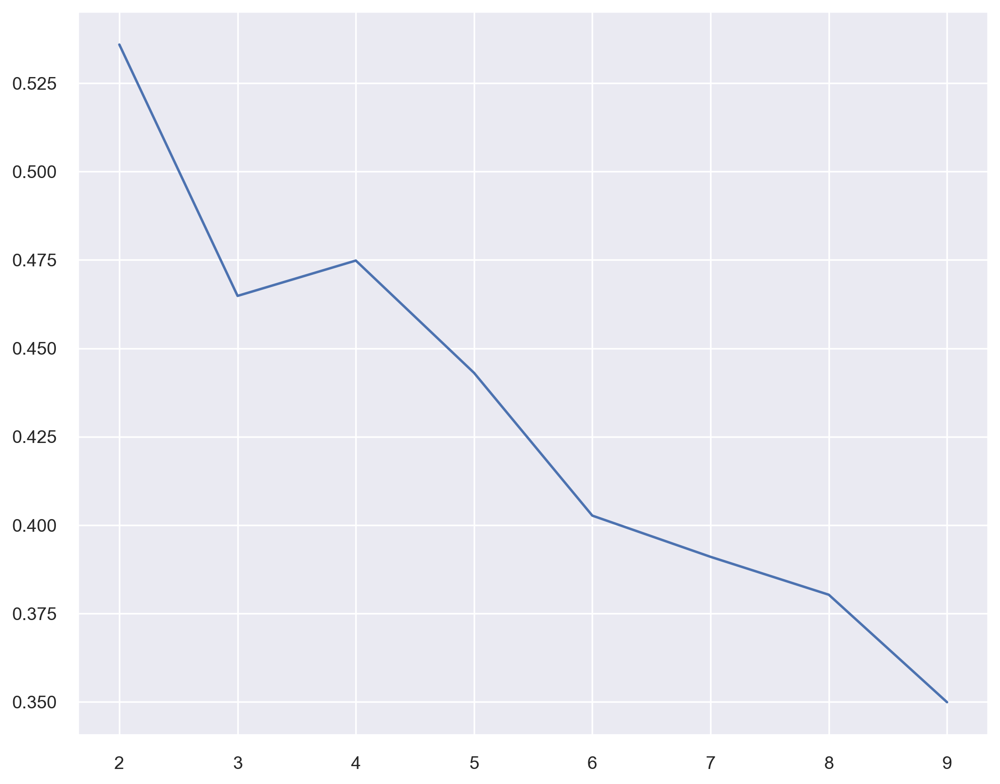

In [195]:
# Ploting Silhoutte Score:
plt.plot(range(2,10),sil_score_norm)

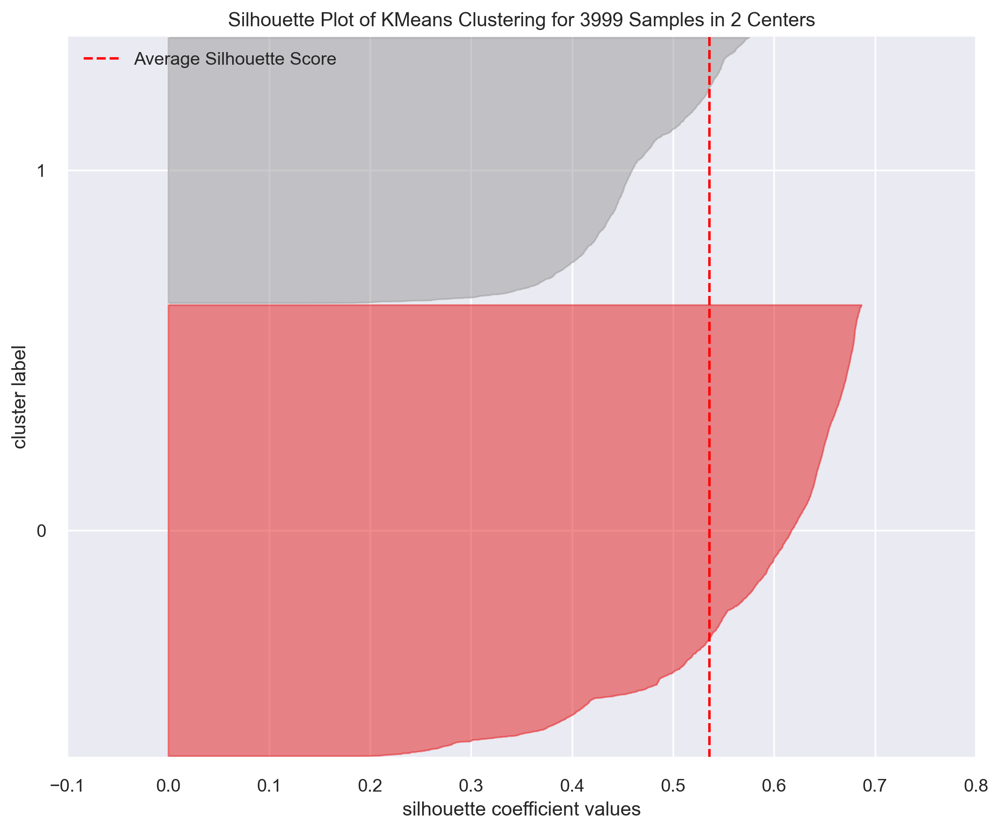

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 3999 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [196]:
# Visualisation of Silhoutte Score for K = 2:
model = SilhouetteVisualizer(KMeans(n_clusters = 2))
vis = model.fit(x_norm)
vis.show()

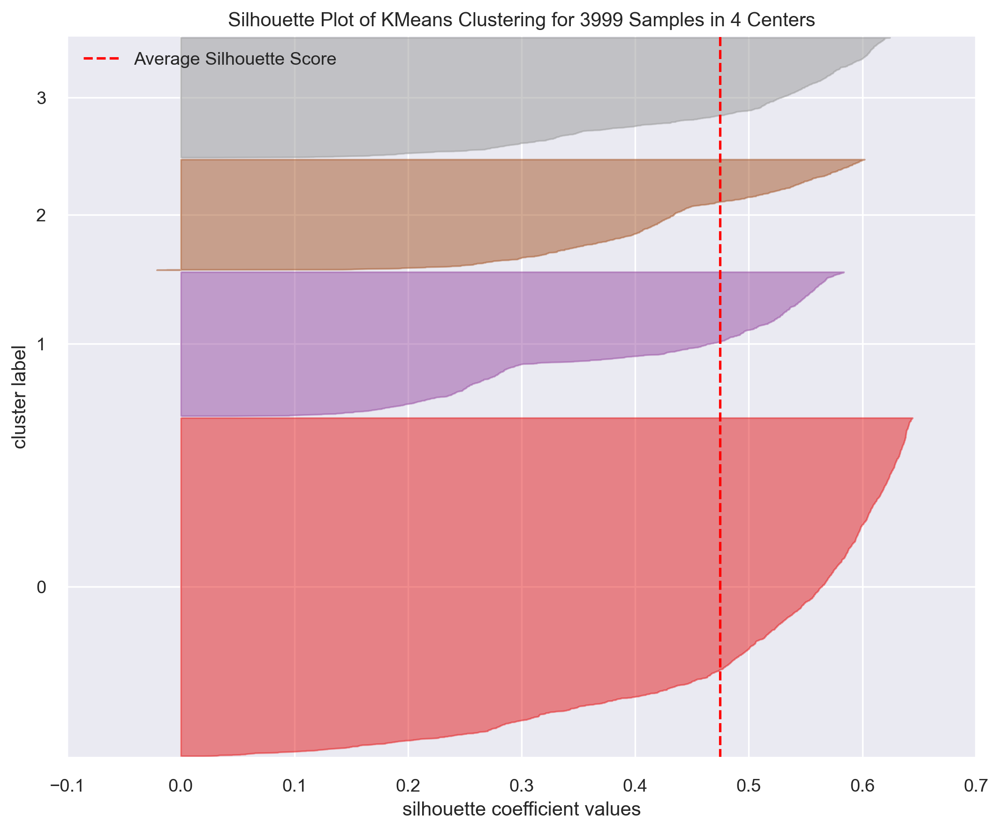

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 3999 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [197]:
# Visualisation of Silhoutte Score for K = 4:
model = SilhouetteVisualizer(KMeans(n_clusters = 4))
vis = model.fit(x_norm)
vis.show()

> * #### Silhoutte Score with Normalised data and 2 clusters is maximum, i.e. 0.53
> * #### In Silhouette Visualiser for 2 Clusters both cluster bands crosses the average Silhoutte Score line (Red line), there is no negative Silhoutte coefficient values but the band sizes are not equal.
> * #### For 4 Cluster Silhouette Visualiser we can see negative Silhoutte coefficient values.
> * #### So we consider the Normalised data with 2 clusters for our final model building.

 ### <font color ='green'> ➡ <u>Final Model with 2 Clusters:</u>

In [57]:
km = KMeans(n_clusters= 2)
Clusters_k = km.fit_predict(x_norm)
Clusters_k

array([0, 0, 0, ..., 1, 0, 0])

In [58]:
df ['Clusters_K'] = Clusters_k
df.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Clusters_1,Clusters_2,Clusters_K
ID,,,,,,,,,,,,,,
1,28143,0,1,1,1,174,1,0,0,7000,0,0,0,0
2,19244,0,1,1,1,215,2,0,0,6968,0,0,0,0
3,41354,0,1,1,1,4123,4,0,0,7034,0,0,0,0
4,14776,0,1,1,1,500,1,0,0,6952,0,0,0,0
5,97752,0,4,1,1,43300,26,2077,4,6935,1,1,3,1


* ##### <font color ='candy'><u> Cluster Visualisation: </u>

<Axes: xlabel='Bonus_trans', ylabel='Bonus_miles'>

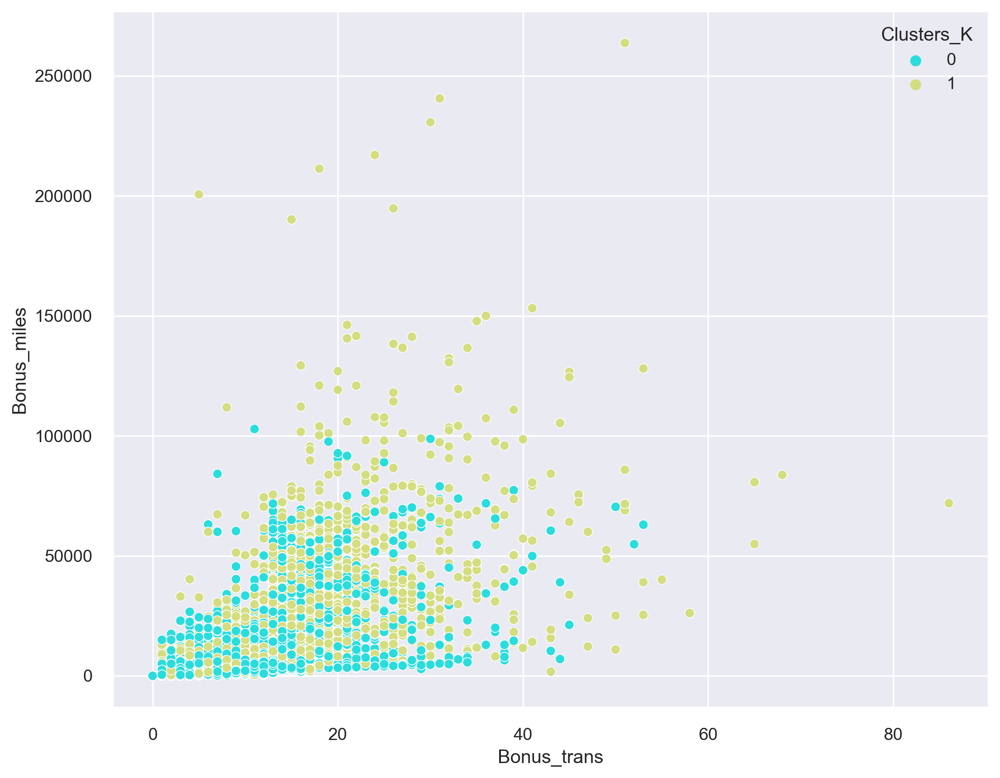

In [198]:
sns.scatterplot(data=df, x= 'Bonus_trans', y='Bonus_miles', hue= 'Clusters_K', palette= 'rainbow')

In [62]:
# Why such clusters are created:
df.groupby('Clusters_K').agg('mean')

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Clusters_1,Clusters_2
Clusters_K,,,,,,,,,,,,,
0,59807.839555,87.602462,1.705322,1.01390,1.008737,10227.689039,9.142971,226.292295,0.652502,3820.652105,0.0,0.0,0.641779
1,97053.051317,240.196489,2.661715,1.01553,1.018231,28905.414585,15.782579,857.501013,2.599595,4625.062120,1.0,1.0,1.722485


> * #### Cluster-1 has high Balance (Number of miles eligible for award travel) and Awarded for free flight.

> * #### <font color = 'brown'>OPTIMAL NUMBER OF CLUSTERS WITH K-MEANS CLUSTERING: 
> #### For 2 clusters there is highest Silhoutte Score (0.53) which is good score.
> #### But we can't see clear clusterisation in visualisation. 
> #### As we know that there is presence of outliers in our data and K-Means Clusering highly affected by noise data points. 
> #### So, Let's See the Clustering with DBSCAN Algorithm which deals with Noise data points.

<br>

 ___

[GO TO TOP](#0.1) 

### <font color = 'magenta'> 3. <u> DBSCAN - ALGORITHM </u> <a class="anchor" id="3"></a>

* ##### <font color = "candy"> DBSCAN (Density-Based Spatial Clustering of Applications with Noise)</font> is a popular clustering algorithm used for data analysis and pattern recognition. It groups data points based on their density, identifying clusters of high-density regions and classifying outliers as noise.

* ##### Unlike K-Means Culstering, you don’t have to specify the number of clusters to use it.

* ##### K- Means and Hierarchical Clustering are sensitive to Noise Data points and they neither recognise complex patterns and shapes nor Outliers.

* ##### In following Figure we can see the clustering pattern generated by DBSCAN and K-Means.

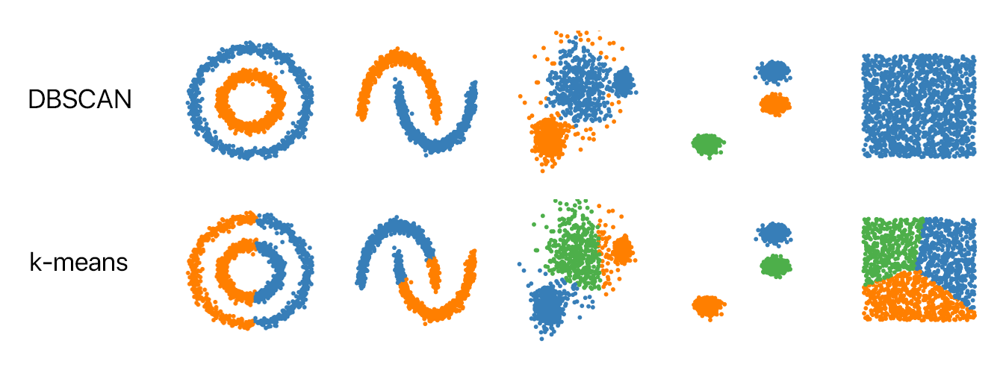

* ##### <font color = "candy">Parameters for DBSCAN :
    
    + <b>Epsilon (ε) value:</b> This is the radius for circle around each and every data point generated by DBSCAN algorithm.
    + <b>Minimum Sample Criteria: </b> This defines how many minimum data points should be their within each circle including central data point.
    
* ##### <font color = "candy">Types of points in Cluster :
    + <b>Core Point:</b>  Central data point around which we are going to make circle, it satisfies the minimum sample criteria.
    + <b>Border Point:</b> Data point which is not able to satisfy minimum sample criteria but already part of core point circle.
    + <b>Noise Point:</b> Data point which is neither part of core point circle nor border point, lies far away from dense region.
    
* ##### <font color = "candy">Selecting Minimum Samples :
    + Larger the dataset larger the value for mimimum points to be choosen.
    + Min_Pts should be greater than equal to number of dimensions (D) / (D+1).
    + Min_Pts = D * 2 
    + Min_Pts should be atleast 3.
    
* ##### <font color = "candy">Finding out Epsilon (ε) value with K-distance Plot: 
    + This technique calculates the average distance between each point and its k nearest neighbors, where k is the MinPts value you selected.
    + The average k-distances are then plotted in ascending order on a k-distance graph. The optimal value for ε at the point of maximum curvature (i.e. where the graph has the greatest slope) is to be selected.

 ### <font color ='green'> ➡ <u>Selection of Epsilon :

 #### <font color ='Candy'> ➡ <u>For Standardised Data:</u>

In [67]:
from sklearn.neighbors import NearestNeighbors

In [68]:
# Calculating distances for Eps:
neigh = NearestNeighbors(n_neighbors = 24).fit(x_sc) # Min_pts > Dimensions 
d,i = neigh.kneighbors(x_sc)   # d = distances of nearest neighbours ; i = indices of the neighbours 

In [69]:
# Sorting the distances in Assending order:
dist = np.sort(d[:,1],axis=0) 

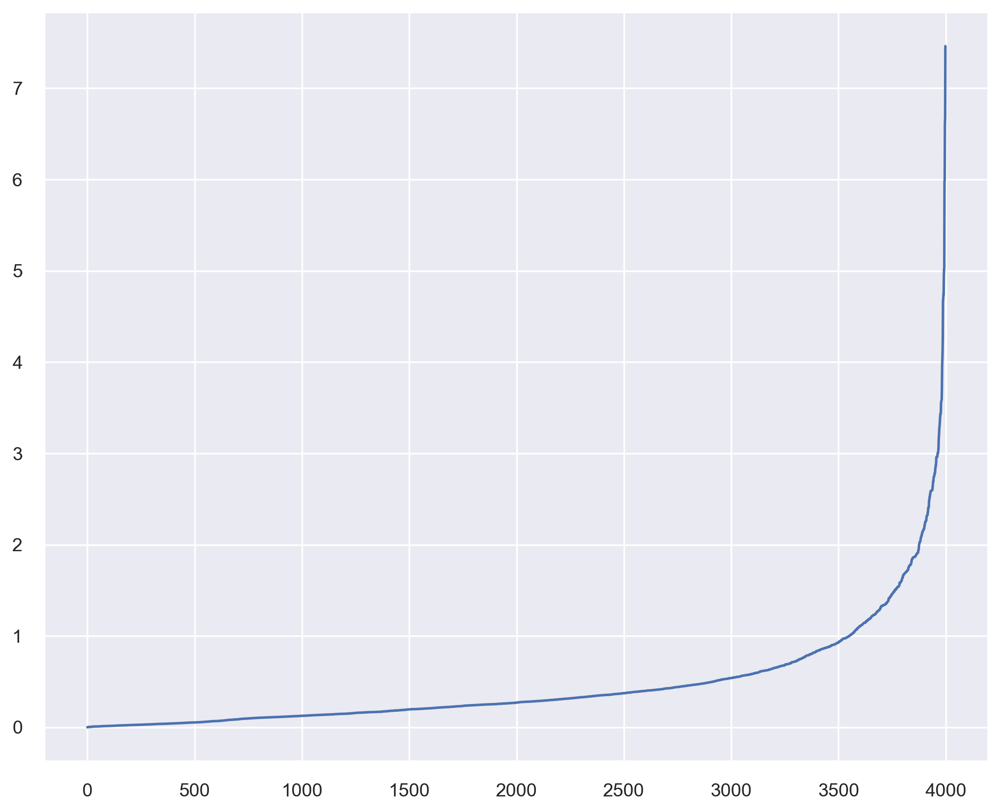

In [199]:
#  K-distance Plot:
plt.plot(dist)

> * #### Here we can see that sudden change in distances around 2 to 3, we select 2.8 as epsilon value.
> * #### For large data min_samples should be large, we select min_samples 24.

In [158]:
db = DBSCAN(eps = 2.8, min_samples = 24)
Cluster_Db = db.fit_predict(x_sc)
print("Silhouette Score For Standardised Data = ",silhouette_score(x_sc,Cluster_Db))

Silhouette Score For Standardised Data =  0.6489091708200595


 #### <font color ='Candy'> ➡ <u>For Normalised Data:</u>

In [151]:
# Calculating distances for Eps:
neigh_norm = NearestNeighbors(n_neighbors = 24).fit(x_norm) # Min_pts > D 
d_n,i_n = neigh_norm.kneighbors(x_norm)  
# d = distances of nearest neighbours ; i = indices of the neighbours 

In [152]:
# Sorting the distances in Assending order:
dist_n = np.sort(d_n[:,1],axis=0) 

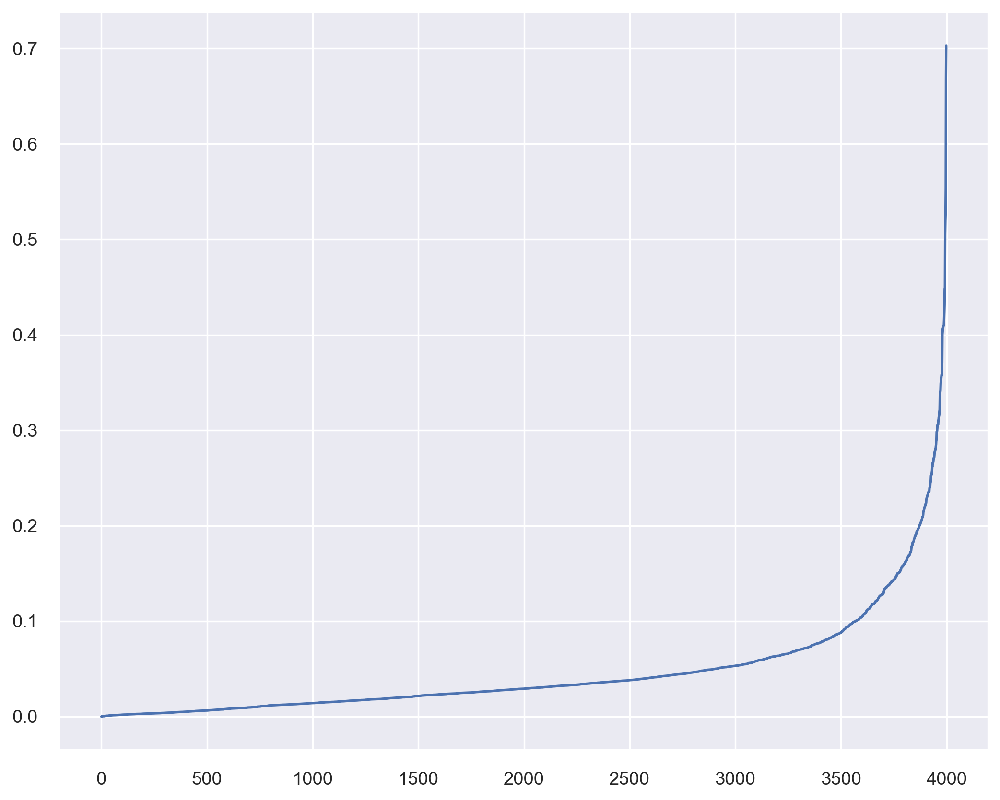

In [200]:
#  K-distance Plot:
plt.plot(dist_n)

> * #### Here we can see that sudden change in distances from 0.4, we select 0.42 as epsilon value.
> * #### For large data min_samples should be large, we select min_samples 24.

In [157]:
db = DBSCAN(eps = 0.42, min_samples = 24)
Cluster_Db_Norm = db.fit_predict(x_norm)
print("Silhouette Score For Normalised Data = ",silhouette_score(x_norm,Cluster_Db_Norm))

Silhouette Score For Normalised Data =  0.5269930538549009


> * #### We can see higher silhouette score for Standardised data so we choose it for our final model building.

 ### <font color ='green'> ➡ <u> Final Model :

In [159]:
# Cluster created with Standardised Data:
Cluster_Db

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [160]:
df['Cluster_Db'] = Cluster_Db

In [161]:
df.groupby("Cluster_Db").agg('mean')

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award,Clusters_1,Clusters_2,Clusters_K
Cluster_Db,,,,,,,,,,,,,,
-1,215255.792135,1562.449438,2.382022,1.325843,1.275281,45411.365169,24.601124,3346.556180,9.387640,4656.022472,0.674157,0.674157,1.561798,0.674157
0,67002.401989,78.041874,2.044491,1.000000,1.000000,15828.059932,10.996336,325.589113,1.000262,4093.521853,0.356189,0.356189,1.017796,0.356189


* ##### <font color ='candy'><u> Cluster Visualisation: </u>

In [180]:
data_Db = df.drop({'cc1_miles', 'cc2_miles', 'cc3_miles','Award', 'Clusters_1', 'Clusters_2', 'Clusters_K'}, axis=1)

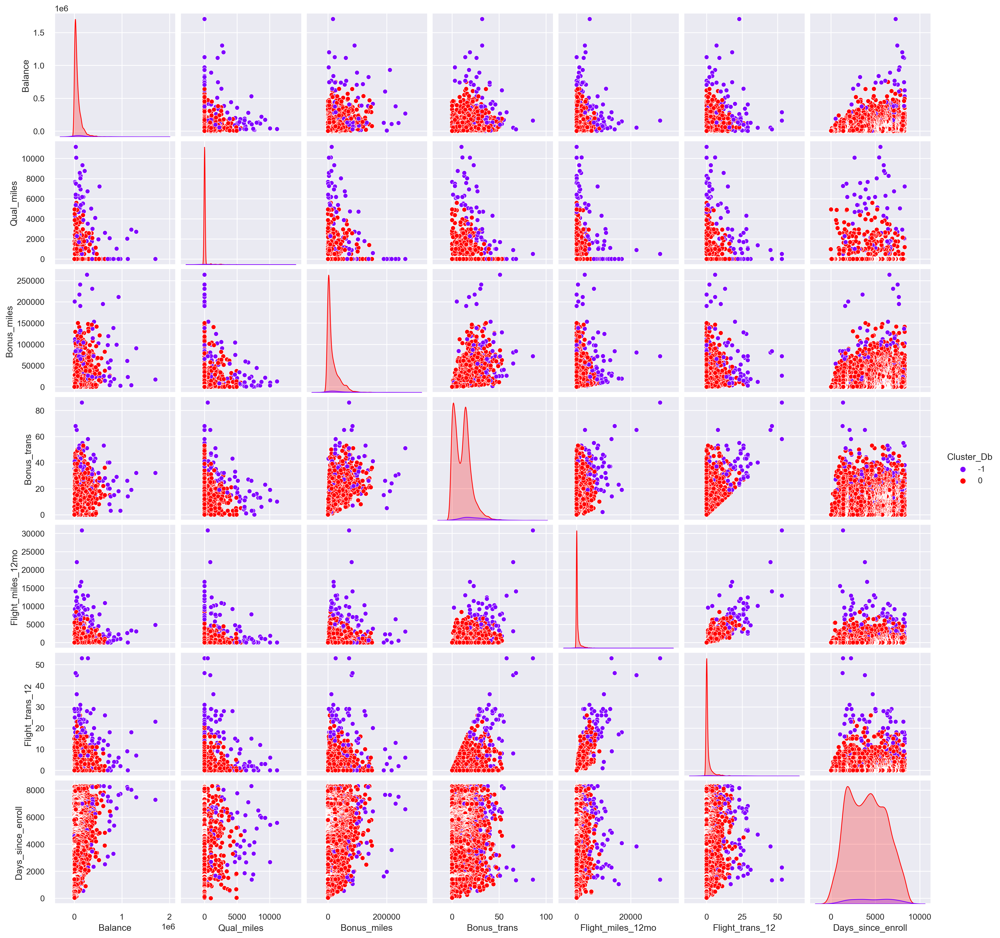

In [201]:
sns.pairplot(data_Db, hue = 'Cluster_Db', palette='rainbow')

> * #### <font color = 'brown'>OPTIMAL NUMBER OF CLUSTERS WITH DBSCAN CLUSTERING:
> * #### In pairplot above we can see only one cluster is created, i.e. Cluster-0.
> * #### Another cluster -1 indecates Noise data points, as they are far away from dense region. 

[GO TO TOP](#0.1) 

* ### <font color = 'blue'> <u> CONCLUSION </u>
    
    + #### We are provided with Airlines data with 11 variables and 3999 records, which is quit large.
    
    + #### We performed Standardisation and Normalisation both ways to find best accuracy level and choosed the data accordingly for final model building.
    
    + #### While performing the Hierarchical Clustering we observed linkages takes lot of time to build, this confirms Hierarchical Clustering are computationally costly and time consuming for large data set.
    
    + #### K-Means Clustering works good for our data set but the accuracy affected by outliers.
    
    + #### DBSCAN detected only one cluster and other remaining points as noise data points.
    
    + #### So, We can conclude that the Heirarchical Clustering computationally costly for large data, K-Means works well with large data but not with noisy data, DBSCAN deals with complex as well as noisy data set.

<br>
<br>
<br>

> # <font color = 'magenta'><u>END</u>
___